In [1]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")


In [2]:
data_dir = r"D:\GTC\NWPU-RESISC45"

classes = os.listdir(data_dir)
print("Number of Classes:", len(classes))
print("Example Classes:", classes[:10])

Number of Classes: 45
Example Classes: ['airplane', 'airport', 'baseball_diamond', 'basketball_court', 'beach', 'bridge', 'chaparral', 'church', 'circular_farmland', 'cloud']


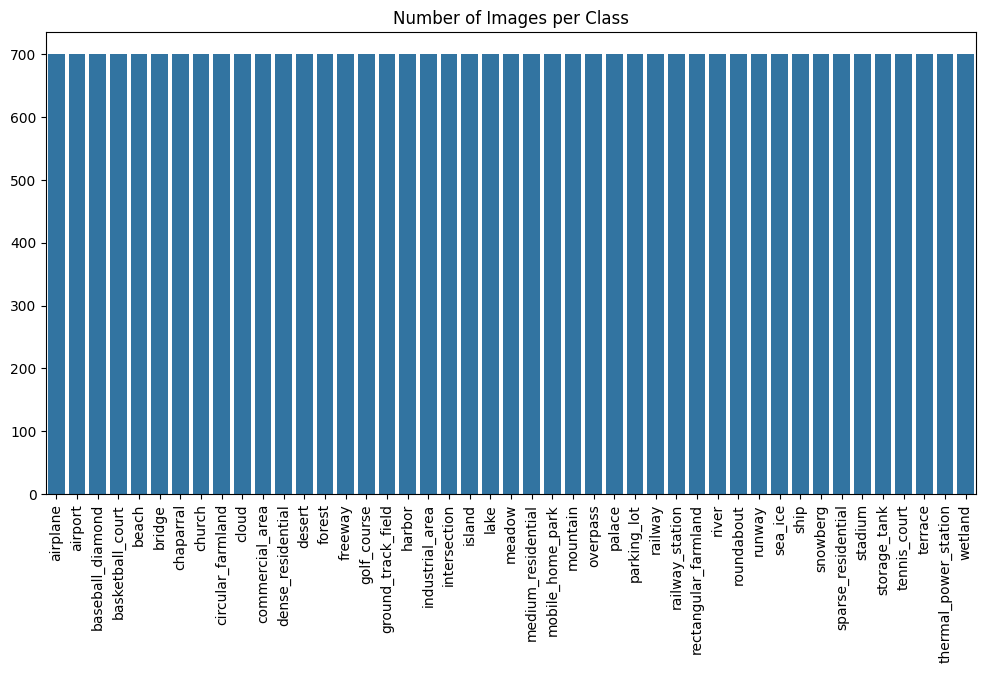

In [3]:
class_counts = {}
for c in classes:
    class_counts[c] = len(os.listdir(os.path.join(data_dir, c)))

plt.figure(figsize=(12,6))
sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()))
plt.xticks(rotation=90)
plt.title("Number of Images per Class")
plt.show()

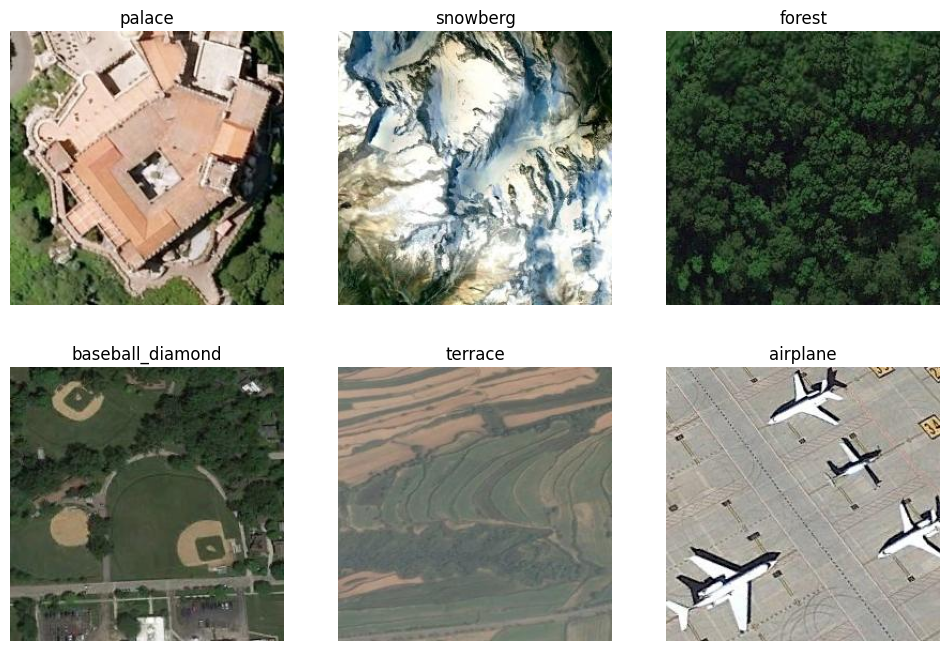

In [4]:
import matplotlib.image as mpimg

sample_classes = random.sample(classes, 6)

plt.figure(figsize=(12,8))
for i, c in enumerate(sample_classes):
    img_path = os.path.join(data_dir, c, random.choice(os.listdir(os.path.join(data_dir, c))))
    img = mpimg.imread(img_path)
    plt.subplot(2,3,i+1)
    plt.imshow(img)
    plt.title(c)
    plt.axis("off")
plt.show()

In [5]:
transform = {
    "train": transforms.Compose([
        transforms.Resize((224,224)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(20),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    "val": transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])
}

train_dataset = datasets.ImageFolder(root=data_dir, transform=transform["train"])
val_size = int(0.2 * len(train_dataset))
train_size = len(train_dataset) - val_size

train_data, val_data = torch.utils.data.random_split(train_dataset, [train_size, val_size])
train_loader = DataLoader(train_data, batch_size=32, shuffle=True)
val_loader   = DataLoader(val_data, batch_size=32, shuffle=False)

print("Train Samples:", len(train_data))
print("Validation Samples:", len(val_data))

Train Samples: 25200
Validation Samples: 6300


In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.resnet50(pretrained=True)
for param in model.parameters():
    param.requires_grad = False  # Freeze backbone

num_features = model.fc.in_features
model.fc = nn.Sequential(
    nn.Linear(num_features, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, len(classes))
)

model = model.to(device)

In [7]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.fc.parameters(), lr=1e-4)

In [8]:
def train_model(model, criterion, optimizer, train_loader, val_loader, epochs=10):
    history = {"train_loss": [], "val_loss": [], "train_acc": [], "val_acc": []}

    for epoch in range(epochs):
        model.train()
        running_loss, running_corrects = 0, 0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            _, preds = torch.max(outputs, 1)

            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = running_corrects.double() / len(train_loader.dataset)

        # validation
        model.eval()
        val_loss, val_corrects = 0, 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                _, preds = torch.max(outputs, 1)
                val_loss += loss.item() * inputs.size(0)
                val_corrects += torch.sum(preds == labels.data)

        val_loss /= len(val_loader.dataset)
        val_acc = val_corrects.double() / len(val_loader.dataset)

        print(f"Epoch {epoch+1}/{epochs} - "
              f"Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}, "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

        history["train_loss"].append(epoch_loss)
        history["val_loss"].append(val_loss)
        history["train_acc"].append(epoch_acc.item())
        history["val_acc"].append(val_acc.item())

    return history

history = train_model(model, criterion, optimizer, train_loader, val_loader, epochs=10)

Epoch 1/10 - Train Loss: 2.6418, Train Acc: 0.4050, Val Loss: 1.5458, Val Acc: 0.6846
Epoch 2/10 - Train Loss: 1.4909, Train Acc: 0.6148, Val Loss: 1.0555, Val Acc: 0.7411
Epoch 3/10 - Train Loss: 1.1818, Train Acc: 0.6745, Val Loss: 0.8924, Val Acc: 0.7567
Epoch 4/10 - Train Loss: 1.0541, Train Acc: 0.7004, Val Loss: 0.8215, Val Acc: 0.7678
Epoch 5/10 - Train Loss: 0.9581, Train Acc: 0.7233, Val Loss: 0.7563, Val Acc: 0.7811
Epoch 6/10 - Train Loss: 0.9085, Train Acc: 0.7326, Val Loss: 0.7088, Val Acc: 0.7952
Epoch 7/10 - Train Loss: 0.8615, Train Acc: 0.7472, Val Loss: 0.6796, Val Acc: 0.7983
Epoch 8/10 - Train Loss: 0.8227, Train Acc: 0.7547, Val Loss: 0.6510, Val Acc: 0.7994
Epoch 9/10 - Train Loss: 0.7978, Train Acc: 0.7633, Val Loss: 0.6365, Val Acc: 0.8043
Epoch 10/10 - Train Loss: 0.7694, Train Acc: 0.7682, Val Loss: 0.6138, Val Acc: 0.8151


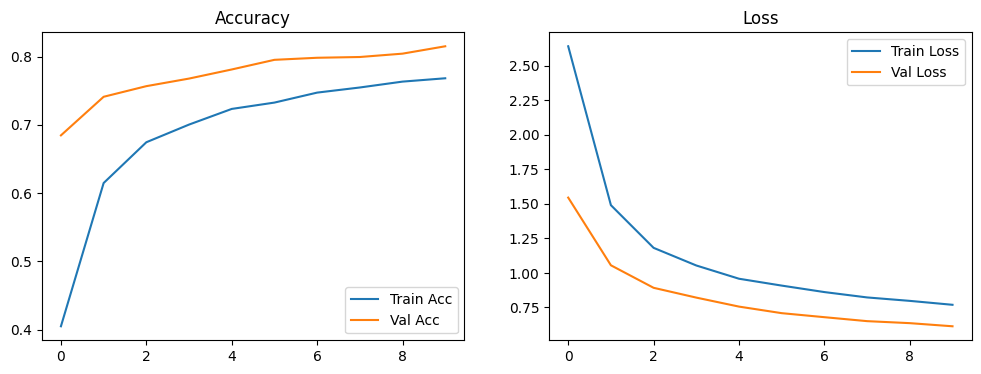

In [9]:
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.plot(history["train_acc"], label="Train Acc")
plt.plot(history["val_acc"], label="Val Acc")
plt.legend()
plt.title("Accuracy")

plt.subplot(1,2,2)
plt.plot(history["train_loss"], label="Train Loss")
plt.plot(history["val_loss"], label="Val Loss")
plt.legend()
plt.title("Loss")

plt.show()

In [10]:
y_true = []
y_pred = []

model.eval()
with torch.no_grad():
    for inputs, labels in val_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

y_true = np.array(y_true)
y_pred = np.array(y_pred)

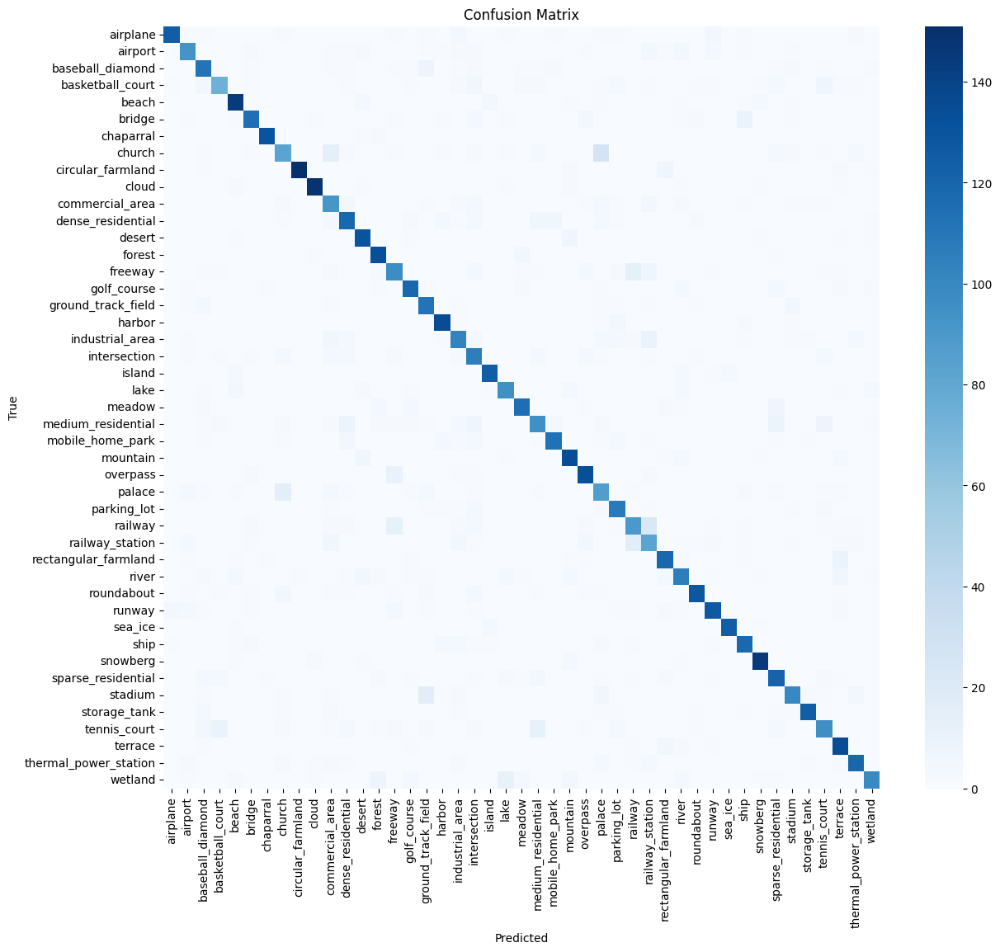

In [11]:
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(14,12))
sns.heatmap(cm, annot=False, fmt="d", cmap="Blues",
            xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

In [12]:
report = classification_report(y_true, y_pred, target_names=classes)
print(report)

                       precision    recall  f1-score   support

             airplane       0.95      0.86      0.90       144
              airport       0.81      0.76      0.78       123
     baseball_diamond       0.76      0.81      0.79       138
     basketball_court       0.80      0.64      0.71       116
                beach       0.86      0.89      0.88       161
               bridge       0.88      0.80      0.84       142
            chaparral       0.98      0.98      0.98       133
               church       0.69      0.57      0.63       145
    circular_farmland       0.99      0.92      0.96       164
                cloud       0.96      0.94      0.95       158
      commercial_area       0.63      0.75      0.69       122
    dense_residential       0.75      0.78      0.77       152
               desert       0.86      0.92      0.89       142
               forest       0.85      0.95      0.90       140
              freeway       0.72      0.70      0.71  

In [13]:
# Install efficientnet if not already installed
%pip install efficientnet-pytorch


Defaulting to user installation because normal site-packages is not writeable
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16519 sha256=cdbcd62ff1555a0e3f09129480c8bcc44a57d5b044c1c936c499b04da19e6f33
  Stored in directory: c:\users\tarik\appdata\local\packages\pythonsoftwarefoundation.python.3.12_qbz5n2kfra8p0\localcache\local\pip\cache\wheels\9c\3f\43\e6271c7026fe08c185da2be23c98c8e87477d3db63f41f32ad
Successfully built efficientnet-pytorch
Note: you may need to restart the kernel to use updated packages.


  DEPRECATION: Building 'efficientnet-pytorch' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'efficientnet-pytorch'. Discussion can be found at https://github.com/pypa/pip/issues/6334


In [14]:
# Import EfficientNet
from efficientnet_pytorch import EfficientNet
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import CosineAnnealingLR, ReduceLROnPlateau


In [15]:
# Create EfficientNetB0 model with fine-tuning
def create_efficientnet_model(num_classes=45, pretrained=True, freeze_backbone=False):
    """
    Create EfficientNetB0 model for fine-tuning
    
    Args:
        num_classes: Number of output classes
        pretrained: Whether to use pretrained weights
        freeze_backbone: Whether to freeze the backbone layers
    """
    # Load pre-trained EfficientNetB0
    model = EfficientNet.from_pretrained('efficientnet-b0') if pretrained else EfficientNet.from_name('efficientnet-b0')
    
    # Get the number of input features for the classifier
    num_features = model._fc.in_features
    
    # Replace the classifier with our custom one
    model._fc = nn.Sequential(
        nn.Dropout(0.3),
        nn.Linear(num_features, 512),
        nn.ReLU(),
        nn.Dropout(0.2),
        nn.Linear(512, 256),
        nn.ReLU(),
        nn.Dropout(0.1),
        nn.Linear(256, num_classes)
    )
    
    # Freeze backbone if specified
    if freeze_backbone:
        for param in model.parameters():
            param.requires_grad = False
        # Only unfreeze the classifier
        for param in model._fc.parameters():
            param.requires_grad = True
    
    return model

# Create the model
efficientnet_model = create_efficientnet_model(num_classes=len(classes), pretrained=True, freeze_backbone=False)
efficientnet_model = efficientnet_model.to(device)

print(f"Model created with {sum(p.numel() for p in efficientnet_model.parameters() if p.requires_grad)} trainable parameters")


Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to C:\Users\tarik/.cache\torch\hub\checkpoints\efficientnet-b0-355c32eb.pth
100%|██████████| 20.4M/20.4M [00:08<00:00, 2.54MB/s]


Loaded pretrained weights for efficientnet-b0
Model created with 4806313 trainable parameters


In [16]:
# Setup optimizer and loss function for EfficientNet
criterion = nn.CrossEntropyLoss()

# Use different learning rates for backbone and classifier
backbone_params = []
classifier_params = []

for name, param in efficientnet_model.named_parameters():
    if param.requires_grad:
        if '_fc' in name:
            classifier_params.append(param)
        else:
            backbone_params.append(param)

# Different learning rates for backbone and classifier
optimizer = optim.AdamW([
    {'params': backbone_params, 'lr': 1e-4},  # Lower LR for pretrained backbone
    {'params': classifier_params, 'lr': 1e-3}  # Higher LR for new classifier
], weight_decay=0.01)

# Learning rate scheduler
scheduler = CosineAnnealingLR(optimizer, T_max=20, eta_min=1e-6)

print(f"Backbone parameters: {len(backbone_params)}")
print(f"Classifier parameters: {len(classifier_params)}")
print(f"Total trainable parameters: {sum(p.numel() for p in efficientnet_model.parameters() if p.requires_grad)}")


Backbone parameters: 211
Classifier parameters: 6
Total trainable parameters: 4806313


In [17]:
# Enhanced training function with better monitoring
def train_efficientnet(model, criterion, optimizer, scheduler, train_loader, val_loader, epochs=20, patience=5):
    """
    Enhanced training function for EfficientNet with early stopping and better monitoring
    """
    history = {"train_loss": [], "val_loss": [], "train_acc": [], "val_acc": [], "lr": []}
    best_val_acc = 0
    patience_counter = 0
    
    for epoch in range(epochs):
        # Training phase
        model.train()
        running_loss, running_corrects = 0, 0
        
        train_pbar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{epochs} [Train]')
        for inputs, labels in train_pbar:
            inputs, labels = inputs.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            _, preds = torch.max(outputs, 1)
            
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)
            
            # Update progress bar
            train_pbar.set_postfix({
                'Loss': f'{loss.item():.4f}',
                'Acc': f'{torch.sum(preds == labels.data).double() / inputs.size(0):.4f}'
            })
        
        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = running_corrects.double() / len(train_loader.dataset)
        
        # Validation phase
        model.eval()
        val_loss, val_corrects = 0, 0
        with torch.no_grad():
            val_pbar = tqdm(val_loader, desc=f'Epoch {epoch+1}/{epochs} [Val]')
            for inputs, labels in val_pbar:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                _, preds = torch.max(outputs, 1)
                
                val_loss += loss.item() * inputs.size(0)
                val_corrects += torch.sum(preds == labels.data)
                
                val_pbar.set_postfix({
                    'Loss': f'{loss.item():.4f}',
                    'Acc': f'{torch.sum(preds == labels.data).double() / inputs.size(0):.4f}'
                })
        
        val_loss /= len(val_loader.dataset)
        val_acc = val_corrects.double() / len(val_loader.dataset)
        
        # Learning rate
        current_lr = optimizer.param_groups[0]['lr']
        
        # Update scheduler
        scheduler.step()
        
        # Early stopping
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            patience_counter = 0
            # Save best model
            torch.save(model.state_dict(), 'best_efficientnet_model.pth')
        else:
            patience_counter += 1
        
        print(f"Epoch {epoch+1}/{epochs} - "
              f"Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}, "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}, "
              f"LR: {current_lr:.6f}, Best Val Acc: {best_val_acc:.4f}")
        
        history["train_loss"].append(epoch_loss)
        history["val_loss"].append(val_loss)
        history["train_acc"].append(epoch_acc.item())
        history["val_acc"].append(val_acc.item())
        history["lr"].append(current_lr)
        
        # Early stopping check
        if patience_counter >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break
    
    return history

# Train the EfficientNet model
print("Starting EfficientNetB0 training...")
efficientnet_history = train_efficientnet(
    efficientnet_model, criterion, optimizer, scheduler, 
    train_loader, val_loader, epochs=20, patience=5
)


Starting EfficientNetB0 training...


Epoch 1/20 [Val]: 100%|██████████| 197/197 [00:22<00:00,  8.74it/s, Loss=0.5443, Acc=0.7500]


Epoch 1/20 - Train Loss: 0.9406, Train Acc: 0.7267, Val Loss: 0.3243, Val Acc: 0.8937, LR: 0.000100, Best Val Acc: 0.8937


Epoch 2/20 [Val]: 100%|██████████| 197/197 [00:22<00:00,  8.73it/s, Loss=0.3434, Acc=0.8571]


Epoch 2/20 - Train Loss: 0.3620, Train Acc: 0.8854, Val Loss: 0.2478, Val Acc: 0.9252, LR: 0.000099, Best Val Acc: 0.9252


Epoch 3/20 [Val]: 100%|██████████| 197/197 [00:22<00:00,  8.71it/s, Loss=0.1383, Acc=0.9286]


Epoch 3/20 - Train Loss: 0.2650, Train Acc: 0.9137, Val Loss: 0.2472, Val Acc: 0.9295, LR: 0.000098, Best Val Acc: 0.9295


Epoch 4/20 [Val]: 100%|██████████| 197/197 [00:23<00:00,  8.55it/s, Loss=0.0855, Acc=1.0000]


Epoch 4/20 - Train Loss: 0.2082, Train Acc: 0.9350, Val Loss: 0.1991, Val Acc: 0.9454, LR: 0.000095, Best Val Acc: 0.9454


Epoch 5/20 [Val]: 100%|██████████| 197/197 [00:23<00:00,  8.44it/s, Loss=0.0853, Acc=0.9643]


Epoch 5/20 - Train Loss: 0.1778, Train Acc: 0.9442, Val Loss: 0.2001, Val Acc: 0.9422, LR: 0.000091, Best Val Acc: 0.9454


Epoch 6/20 [Val]: 100%|██████████| 197/197 [00:24<00:00,  8.20it/s, Loss=0.0620, Acc=0.9643]


Epoch 6/20 - Train Loss: 0.1463, Train Acc: 0.9535, Val Loss: 0.2087, Val Acc: 0.9459, LR: 0.000086, Best Val Acc: 0.9459


Epoch 7/20 [Val]: 100%|██████████| 197/197 [00:24<00:00,  8.07it/s, Loss=0.1528, Acc=0.8929]


Epoch 7/20 - Train Loss: 0.1274, Train Acc: 0.9594, Val Loss: 0.1995, Val Acc: 0.9517, LR: 0.000080, Best Val Acc: 0.9517


Epoch 8/20 [Val]: 100%|██████████| 197/197 [00:22<00:00,  8.78it/s, Loss=0.3227, Acc=0.9286]


Epoch 8/20 - Train Loss: 0.1148, Train Acc: 0.9636, Val Loss: 0.2076, Val Acc: 0.9510, LR: 0.000073, Best Val Acc: 0.9517


Epoch 9/20 [Val]: 100%|██████████| 197/197 [00:22<00:00,  8.90it/s, Loss=0.3508, Acc=0.9286]


Epoch 9/20 - Train Loss: 0.0953, Train Acc: 0.9710, Val Loss: 0.1921, Val Acc: 0.9562, LR: 0.000066, Best Val Acc: 0.9562


Epoch 10/20 [Val]: 100%|██████████| 197/197 [00:22<00:00,  8.58it/s, Loss=0.1376, Acc=0.9643]


Epoch 10/20 - Train Loss: 0.0792, Train Acc: 0.9746, Val Loss: 0.2093, Val Acc: 0.9546, LR: 0.000058, Best Val Acc: 0.9562


Epoch 11/20 [Val]: 100%|██████████| 197/197 [00:24<00:00,  8.16it/s, Loss=0.0848, Acc=0.9643]


Epoch 11/20 - Train Loss: 0.0705, Train Acc: 0.9769, Val Loss: 0.2042, Val Acc: 0.9562, LR: 0.000051, Best Val Acc: 0.9562


Epoch 12/20 [Val]: 100%|██████████| 197/197 [00:23<00:00,  8.30it/s, Loss=0.1403, Acc=0.9286]


Epoch 12/20 - Train Loss: 0.0601, Train Acc: 0.9809, Val Loss: 0.1952, Val Acc: 0.9600, LR: 0.000043, Best Val Acc: 0.9600


Epoch 13/20 [Val]: 100%|██████████| 197/197 [00:23<00:00,  8.41it/s, Loss=0.0284, Acc=1.0000]


Epoch 13/20 - Train Loss: 0.0496, Train Acc: 0.9837, Val Loss: 0.2017, Val Acc: 0.9565, LR: 0.000035, Best Val Acc: 0.9600


Epoch 14/20 [Val]: 100%|██████████| 197/197 [00:24<00:00,  8.17it/s, Loss=0.0039, Acc=1.0000]


Epoch 14/20 - Train Loss: 0.0474, Train Acc: 0.9851, Val Loss: 0.1864, Val Acc: 0.9625, LR: 0.000028, Best Val Acc: 0.9625


Epoch 15/20 [Val]: 100%|██████████| 197/197 [00:23<00:00,  8.37it/s, Loss=0.2813, Acc=0.9286]


Epoch 15/20 - Train Loss: 0.0369, Train Acc: 0.9877, Val Loss: 0.1933, Val Acc: 0.9606, LR: 0.000021, Best Val Acc: 0.9625


Epoch 16/20 [Val]: 100%|██████████| 197/197 [00:23<00:00,  8.29it/s, Loss=0.0720, Acc=0.9643]


Epoch 16/20 - Train Loss: 0.0354, Train Acc: 0.9890, Val Loss: 0.2004, Val Acc: 0.9622, LR: 0.000015, Best Val Acc: 0.9625


Epoch 17/20 [Val]: 100%|██████████| 197/197 [00:23<00:00,  8.53it/s, Loss=0.0265, Acc=1.0000]


Epoch 17/20 - Train Loss: 0.0339, Train Acc: 0.9897, Val Loss: 0.1851, Val Acc: 0.9652, LR: 0.000010, Best Val Acc: 0.9652


Epoch 18/20 [Val]: 100%|██████████| 197/197 [00:23<00:00,  8.38it/s, Loss=0.1624, Acc=0.9643]


Epoch 18/20 - Train Loss: 0.0272, Train Acc: 0.9919, Val Loss: 0.1890, Val Acc: 0.9641, LR: 0.000006, Best Val Acc: 0.9652


Epoch 19/20 [Val]: 100%|██████████| 197/197 [00:24<00:00,  8.14it/s, Loss=0.0665, Acc=0.9643]


Epoch 19/20 - Train Loss: 0.0261, Train Acc: 0.9912, Val Loss: 0.1921, Val Acc: 0.9624, LR: 0.000003, Best Val Acc: 0.9652


Epoch 20/20 [Val]: 100%|██████████| 197/197 [00:22<00:00,  8.66it/s, Loss=0.0037, Acc=1.0000]

Epoch 20/20 - Train Loss: 0.0241, Train Acc: 0.9915, Val Loss: 0.1829, Val Acc: 0.9641, LR: 0.000002, Best Val Acc: 0.9652


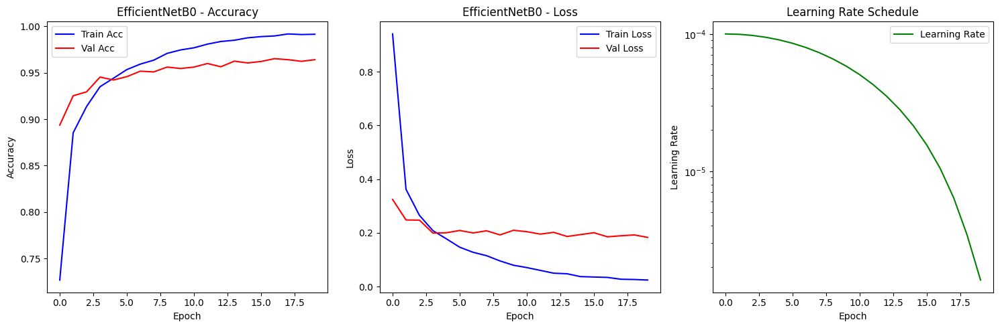

In [18]:
# Plot training results
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(efficientnet_history["train_acc"], label="Train Acc", color='blue')
plt.plot(efficientnet_history["val_acc"], label="Val Acc", color='red')
plt.legend()
plt.title("EfficientNetB0 - Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.subplot(1, 3, 2)
plt.plot(efficientnet_history["train_loss"], label="Train Loss", color='blue')
plt.plot(efficientnet_history["val_loss"], label="Val Loss", color='red')
plt.legend()
plt.title("EfficientNetB0 - Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.subplot(1, 3, 3)
plt.plot(efficientnet_history["lr"], label="Learning Rate", color='green')
plt.legend()
plt.title("Learning Rate Schedule")
plt.xlabel("Epoch")
plt.ylabel("Learning Rate")
plt.yscale('log')

plt.tight_layout()
plt.show()


In [19]:
# Load best model and evaluate
efficientnet_model.load_state_dict(torch.load('best_efficientnet_model.pth'))

# Evaluate on validation set
y_true_eff = []
y_pred_eff = []

efficientnet_model.eval()
with torch.no_grad():
    for inputs, labels in tqdm(val_loader, desc="Evaluating EfficientNet"):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = efficientnet_model(inputs)
        _, preds = torch.max(outputs, 1)
        y_true_eff.extend(labels.cpu().numpy())
        y_pred_eff.extend(preds.cpu().numpy())

y_true_eff = np.array(y_true_eff)
y_pred_eff = np.array(y_pred_eff)

# Calculate final accuracy
final_accuracy = accuracy_score(y_true_eff, y_pred_eff)
print(f"EfficientNetB0 Final Validation Accuracy: {final_accuracy:.4f}")

# Compare with ResNet50
print(f"ResNet50 Final Validation Accuracy: {accuracy_score(y_true, y_pred):.4f}")
print(f"Improvement: {final_accuracy - accuracy_score(y_true, y_pred):.4f}")


Evaluating EfficientNet: 100%|██████████| 197/197 [00:24<00:00,  7.94it/s]

EfficientNetB0 Final Validation Accuracy: 0.9627
ResNet50 Final Validation Accuracy: 0.8190
Improvement: 0.1437


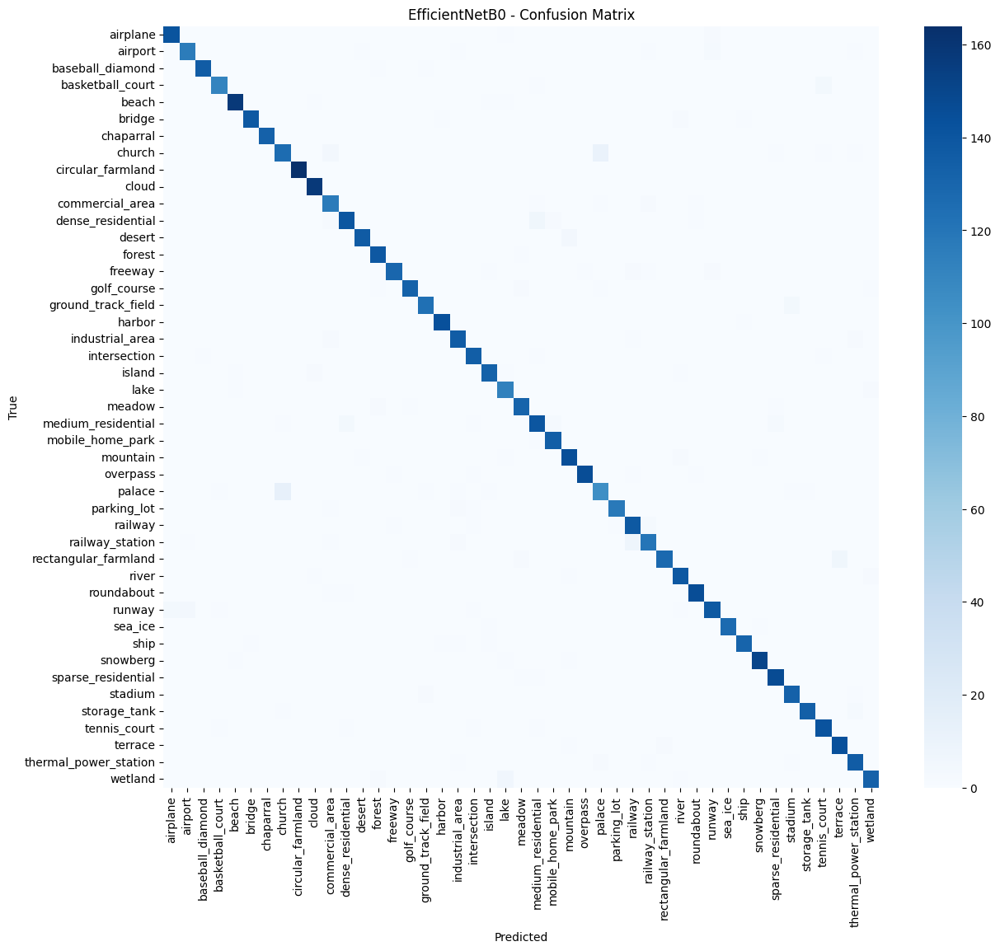

In [20]:
# Confusion Matrix for EfficientNet
cm_eff = confusion_matrix(y_true_eff, y_pred_eff)
plt.figure(figsize=(14,12))
sns.heatmap(cm_eff, annot=False, fmt="d", cmap="Blues",
            xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("EfficientNetB0 - Confusion Matrix")
plt.show()


In [21]:
# Detailed classification report for EfficientNet
report_eff = classification_report(y_true_eff, y_pred_eff, target_names=classes)
print("EfficientNetB0 Classification Report:")
print(report_eff)


EfficientNetB0 Classification Report:
                       precision    recall  f1-score   support

             airplane       0.97      0.98      0.98       144
              airport       0.95      0.94      0.95       123
     baseball_diamond       0.99      0.99      0.99       138
     basketball_court       0.97      0.96      0.97       116
                beach       0.98      0.98      0.98       161
               bridge       0.99      0.97      0.98       142
            chaparral       1.00      1.00      1.00       133
               church       0.89      0.87      0.88       145
    circular_farmland       1.00      1.00      1.00       164
                cloud       0.98      1.00      0.99       158
      commercial_area       0.91      0.96      0.93       122
    dense_residential       0.96      0.92      0.94       152
               desert       0.99      0.96      0.98       142
               forest       0.95      0.99      0.97       140
              fr

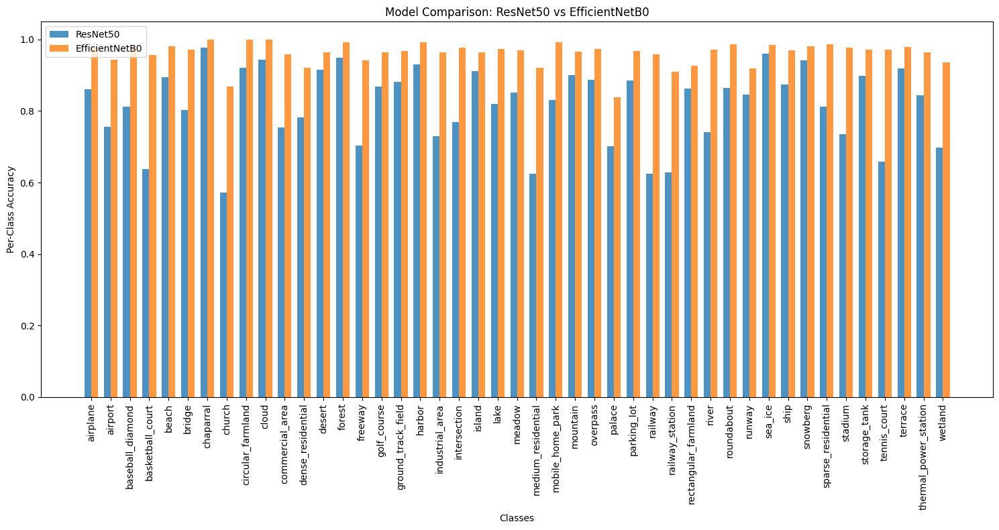


Model Comparison Summary:
ResNet50 Overall Accuracy: 0.8190
EfficientNetB0 Overall Accuracy: 0.9627
Improvement: 0.1437

Classes where EfficientNetB0 shows significant improvement (>5%):
airplane: ResNet50=0.861, EfficientNetB0=0.979 (+0.118)
airport: ResNet50=0.756, EfficientNetB0=0.943 (+0.187)
baseball_diamond: ResNet50=0.812, EfficientNetB0=0.986 (+0.174)
basketball_court: ResNet50=0.638, EfficientNetB0=0.957 (+0.319)
beach: ResNet50=0.894, EfficientNetB0=0.981 (+0.087)
bridge: ResNet50=0.803, EfficientNetB0=0.972 (+0.169)
church: ResNet50=0.572, EfficientNetB0=0.869 (+0.297)
circular_farmland: ResNet50=0.921, EfficientNetB0=1.000 (+0.079)
cloud: ResNet50=0.943, EfficientNetB0=1.000 (+0.057)
commercial_area: ResNet50=0.754, EfficientNetB0=0.959 (+0.205)
dense_residential: ResNet50=0.783, EfficientNetB0=0.921 (+0.138)
freeway: ResNet50=0.703, EfficientNetB0=0.942 (+0.239)
golf_course: ResNet50=0.869, EfficientNetB0=0.964 (+0.095)
ground_track_field: ResNet50=0.882, EfficientNetB0=0

In [22]:
# Model comparison and analysis
def compare_models():
    """Compare ResNet50 and EfficientNetB0 performance"""
    
    # Calculate per-class accuracy for both models
    resnet_acc = []
    efficientnet_acc = []
    
    for i in range(len(classes)):
        # ResNet50
        mask = y_true == i
        if mask.sum() > 0:
            resnet_acc.append((y_pred[mask] == i).mean())
        else:
            resnet_acc.append(0)
            
        # EfficientNet
        mask = y_true_eff == i
        if mask.sum() > 0:
            efficientnet_acc.append((y_pred_eff[mask] == i).mean())
        else:
            efficientnet_acc.append(0)
    
    # Create comparison plot
    plt.figure(figsize=(15, 8))
    x = np.arange(len(classes))
    width = 0.35
    
    plt.bar(x - width/2, resnet_acc, width, label='ResNet50', alpha=0.8)
    plt.bar(x + width/2, efficientnet_acc, width, label='EfficientNetB0', alpha=0.8)
    
    plt.xlabel('Classes')
    plt.ylabel('Per-Class Accuracy')
    plt.title('Model Comparison: ResNet50 vs EfficientNetB0')
    plt.xticks(x, classes, rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    print(f"\nModel Comparison Summary:")
    print(f"ResNet50 Overall Accuracy: {accuracy_score(y_true, y_pred):.4f}")
    print(f"EfficientNetB0 Overall Accuracy: {accuracy_score(y_true_eff, y_pred_eff):.4f}")
    print(f"Improvement: {accuracy_score(y_true_eff, y_pred_eff) - accuracy_score(y_true, y_pred):.4f}")
    
    # Classes where EfficientNet performs better
    better_classes = []
    for i, (r_acc, e_acc) in enumerate(zip(resnet_acc, efficientnet_acc)):
        if e_acc > r_acc + 0.05:  # 5% improvement threshold
            better_classes.append((classes[i], r_acc, e_acc))
    
    print(f"\nClasses where EfficientNetB0 shows significant improvement (>5%):")
    for class_name, r_acc, e_acc in better_classes:
        print(f"{class_name}: ResNet50={r_acc:.3f}, EfficientNetB0={e_acc:.3f} (+{e_acc-r_acc:.3f})")

compare_models()


In [23]:
# Optional: Try different EfficientNet variants
def create_efficientnet_variant(variant='b0', num_classes=45, pretrained=True):
    """Create different EfficientNet variants for comparison"""
    variants = ['b0', 'b1', 'b2', 'b3', 'b4', 'b5', 'b6', 'b7']
    
    if variant not in variants:
        raise ValueError(f"Variant must be one of {variants}")
    
    model = EfficientNet.from_pretrained(f'efficientnet-{variant}') if pretrained else EfficientNet.from_name(f'efficientnet-{variant}')
    
    # Get the number of input features for the classifier
    num_features = model._fc.in_features
    
    # Replace the classifier
    model._fc = nn.Sequential(
        nn.Dropout(0.3),
        nn.Linear(num_features, 512),
        nn.ReLU(),
        nn.Dropout(0.2),
        nn.Linear(512, 256),
        nn.ReLU(),
        nn.Dropout(0.1),
        nn.Linear(256, num_classes)
    )
    
    return model

# Model size comparison
print("EfficientNet Variants Comparison:")
print("=" * 50)

for variant in ['b0', 'b1', 'b2']:
    try:
        model = create_efficientnet_variant(variant, len(classes), pretrained=False)
        total_params = sum(p.numel() for p in model.parameters())
        trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
        print(f"EfficientNet-{variant.upper()}: {total_params:,} total params, {trainable_params:,} trainable")
    except Exception as e:
        print(f"EfficientNet-{variant.upper()}: Error - {e}")

print(f"\nResNet50: {sum(p.numel() for p in model.parameters()):,} total params")


EfficientNet Variants Comparison:
EfficientNet-B0: 4,806,313 total params, 4,806,313 trainable
EfficientNet-B1: 7,311,949 total params, 7,311,949 trainable
EfficientNet-B2: 8,565,295 total params, 8,565,295 trainable

ResNet50: 8,565,295 total params


In [24]:
# ========================================
# COMPREHENSIVE EDA AND VISUALIZATIONS
# ========================================

import cv2
from collections import Counter
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd
from PIL import Image
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA


In [25]:
# 1. DATASET STATISTICS AND DISTRIBUTION ANALYSIS
print("=" * 60)
print("DATASET STATISTICS AND DISTRIBUTION ANALYSIS")
print("=" * 60)

# Calculate detailed statistics
dataset_stats = []
for class_name in classes:
    class_path = os.path.join(data_dir, class_name)
    images = os.listdir(class_path)
    
    # Get image dimensions and file sizes
    dimensions = []
    file_sizes = []
    
    for img_file in images[:50]:  # Sample first 50 images for efficiency
        img_path = os.path.join(class_path, img_file)
        try:
            with Image.open(img_path) as img:
                dimensions.append(img.size)
            file_sizes.append(os.path.getsize(img_path))
        except:
            continue
    
    if dimensions:
        widths, heights = zip(*dimensions)
        dataset_stats.append({
            'class': class_name,
            'total_images': len(images),
            'avg_width': np.mean(widths),
            'avg_height': np.mean(heights),
            'min_width': min(widths),
            'max_width': max(widths),
            'min_height': min(heights),
            'max_height': max(heights),
            'avg_file_size_mb': np.mean(file_sizes) / (1024*1024),
            'aspect_ratio': np.mean([w/h for w, h in dimensions])
        })

# Convert to DataFrame
stats_df = pd.DataFrame(dataset_stats)
print(f"Dataset Overview:")
print(f"Total Classes: {len(classes)}")
print(f"Total Images: {stats_df['total_images'].sum()}")
print(f"Average Images per Class: {stats_df['total_images'].mean():.1f}")
print(f"Standard Deviation: {stats_df['total_images'].std():.1f}")
print(f"Min Images in a Class: {stats_df['total_images'].min()}")
print(f"Max Images in a Class: {stats_df['total_images'].max()}")

print(f"\nImage Dimensions:")
print(f"Average Width: {stats_df['avg_width'].mean():.1f}px")
print(f"Average Height: {stats_df['avg_height'].mean():.1f}px")
print(f"Average Aspect Ratio: {stats_df['aspect_ratio'].mean():.3f}")

# Display first few rows
print(f"\nDetailed Statistics (first 10 classes):")
print(stats_df.head(10).to_string(index=False))


DATASET STATISTICS AND DISTRIBUTION ANALYSIS
Dataset Overview:
Total Classes: 45
Total Images: 31500
Average Images per Class: 700.0
Standard Deviation: 0.0
Min Images in a Class: 700
Max Images in a Class: 700

Image Dimensions:
Average Width: 256.0px
Average Height: 256.0px
Average Aspect Ratio: 1.000

Detailed Statistics (first 10 classes):
            class  total_images  avg_width  avg_height  min_width  max_width  min_height  max_height  avg_file_size_mb  aspect_ratio
         airplane           700      256.0       256.0        256        256         256         256          0.010623           1.0
          airport           700      256.0       256.0        256        256         256         256          0.012894           1.0
 baseball_diamond           700      256.0       256.0        256        256         256         256          0.011793           1.0
 basketball_court           700      256.0       256.0        256        256         256         256          0.012230    

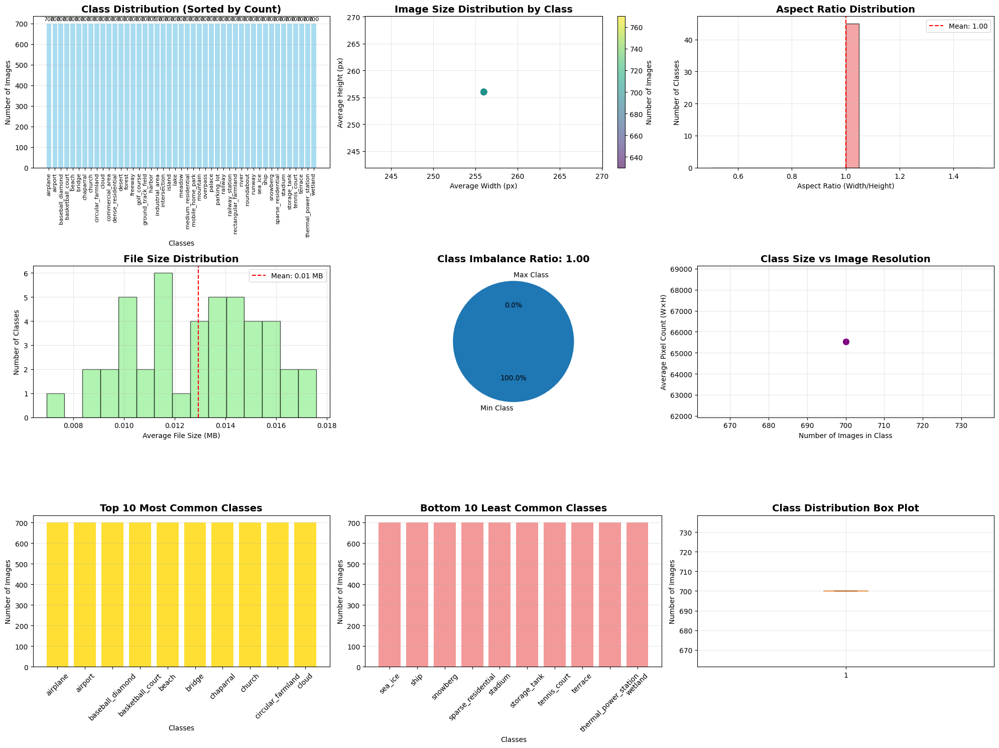

In [26]:
# 2. ADVANCED DISTRIBUTION VISUALIZATIONS
plt.figure(figsize=(20, 15))

# 2.1 Class Distribution (Enhanced)
plt.subplot(3, 3, 1)
sorted_classes = sorted(classes, key=lambda x: class_counts[x], reverse=True)
sorted_counts = [class_counts[c] for c in sorted_classes]
bars = plt.bar(range(len(sorted_classes)), sorted_counts, color='skyblue', alpha=0.7)
plt.title('Class Distribution (Sorted by Count)', fontsize=14, fontweight='bold')
plt.xlabel('Classes')
plt.ylabel('Number of Images')
plt.xticks(range(len(sorted_classes)), sorted_classes, rotation=90, fontsize=8)
plt.grid(axis='y', alpha=0.3)

# Add value labels on bars
for i, bar in enumerate(bars):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 10,
             f'{int(height)}', ha='center', va='bottom', fontsize=8)

# 2.2 Image Size Distribution
plt.subplot(3, 3, 2)
plt.scatter(stats_df['avg_width'], stats_df['avg_height'], 
           s=stats_df['total_images']/10, alpha=0.6, c=stats_df['total_images'], 
           cmap='viridis')
plt.xlabel('Average Width (px)')
plt.ylabel('Average Height (px)')
plt.title('Image Size Distribution by Class', fontsize=14, fontweight='bold')
plt.colorbar(label='Number of Images')
plt.grid(alpha=0.3)

# 2.3 Aspect Ratio Analysis
plt.subplot(3, 3, 3)
plt.hist(stats_df['aspect_ratio'], bins=20, alpha=0.7, color='lightcoral', edgecolor='black')
plt.xlabel('Aspect Ratio (Width/Height)')
plt.ylabel('Number of Classes')
plt.title('Aspect Ratio Distribution', fontsize=14, fontweight='bold')
plt.axvline(stats_df['aspect_ratio'].mean(), color='red', linestyle='--', 
           label=f'Mean: {stats_df["aspect_ratio"].mean():.2f}')
plt.legend()
plt.grid(alpha=0.3)

# 2.4 File Size Distribution
plt.subplot(3, 3, 4)
plt.hist(stats_df['avg_file_size_mb'], bins=15, alpha=0.7, color='lightgreen', edgecolor='black')
plt.xlabel('Average File Size (MB)')
plt.ylabel('Number of Classes')
plt.title('File Size Distribution', fontsize=14, fontweight='bold')
plt.axvline(stats_df['avg_file_size_mb'].mean(), color='red', linestyle='--',
           label=f'Mean: {stats_df["avg_file_size_mb"].mean():.2f} MB')
plt.legend()
plt.grid(alpha=0.3)

# 2.5 Class Balance Analysis
plt.subplot(3, 3, 5)
imbalance_ratio = stats_df['total_images'].max() / stats_df['total_images'].min()
plt.pie([stats_df['total_images'].min(), stats_df['total_images'].max() - stats_df['total_images'].min()], 
        labels=['Min Class', 'Max Class'], autopct='%1.1f%%', startangle=90)
plt.title(f'Class Imbalance Ratio: {imbalance_ratio:.2f}', fontsize=14, fontweight='bold')

# 2.6 Image Count vs Average Size
plt.subplot(3, 3, 6)
plt.scatter(stats_df['total_images'], stats_df['avg_width'] * stats_df['avg_height'], 
           alpha=0.6, s=60, c='purple')
plt.xlabel('Number of Images in Class')
plt.ylabel('Average Pixel Count (W×H)')
plt.title('Class Size vs Image Resolution', fontsize=14, fontweight='bold')
plt.grid(alpha=0.3)

# 2.7 Top 10 Most Common Classes
plt.subplot(3, 3, 7)
top_10_classes = sorted_classes[:10]
top_10_counts = [class_counts[c] for c in top_10_classes]
bars = plt.bar(range(len(top_10_classes)), top_10_counts, color='gold', alpha=0.8)
plt.title('Top 10 Most Common Classes', fontsize=14, fontweight='bold')
plt.xlabel('Classes')
plt.ylabel('Number of Images')
plt.xticks(range(len(top_10_classes)), top_10_classes, rotation=45, fontsize=10)
plt.grid(axis='y', alpha=0.3)

# 2.8 Bottom 10 Least Common Classes
plt.subplot(3, 3, 8)
bottom_10_classes = sorted_classes[-10:]
bottom_10_counts = [class_counts[c] for c in bottom_10_classes]
bars = plt.bar(range(len(bottom_10_classes)), bottom_10_counts, color='lightcoral', alpha=0.8)
plt.title('Bottom 10 Least Common Classes', fontsize=14, fontweight='bold')
plt.xlabel('Classes')
plt.ylabel('Number of Images')
plt.xticks(range(len(bottom_10_classes)), bottom_10_classes, rotation=45, fontsize=10)
plt.grid(axis='y', alpha=0.3)

# 2.9 Class Distribution Box Plot
plt.subplot(3, 3, 9)
plt.boxplot([class_counts[c] for c in classes], patch_artist=True, 
           boxprops=dict(facecolor='lightblue', alpha=0.7))
plt.ylabel('Number of Images')
plt.title('Class Distribution Box Plot', fontsize=14, fontweight='bold')
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()


IMAGE SAMPLE ANALYSIS AND VISUALIZATION
Analyzing sample images from different class types...

Most Common Class: airplane (700 images)


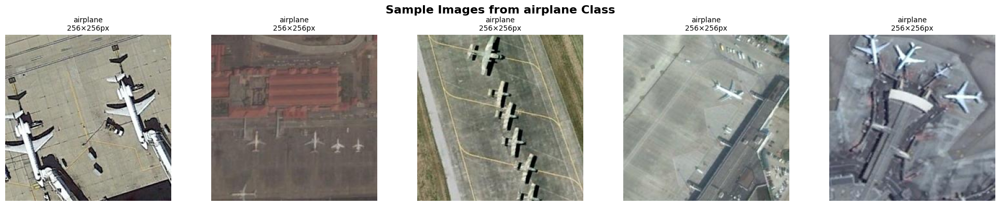


Least Common Class: airplane (700 images)


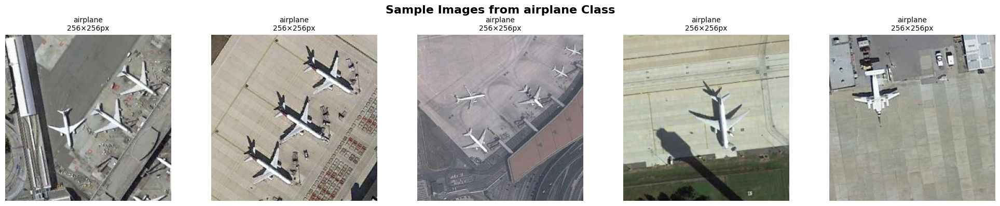


Airplane Class (700 images):


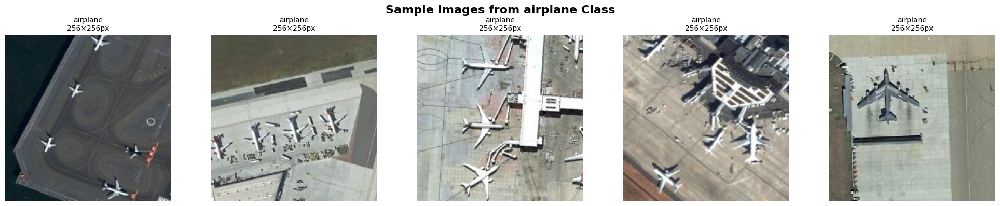


Beach Class (700 images):


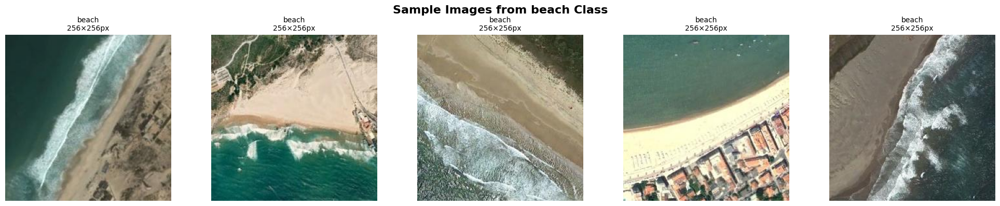


Mountain Class (700 images):


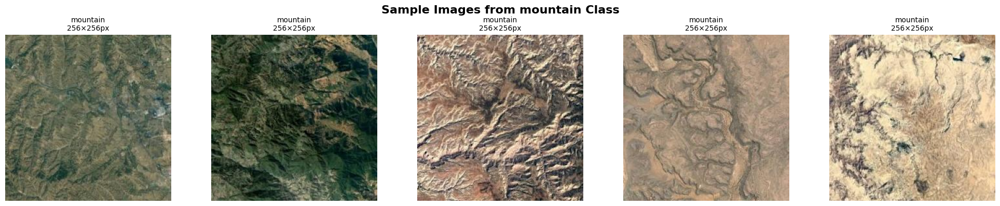


Church Class (700 images):


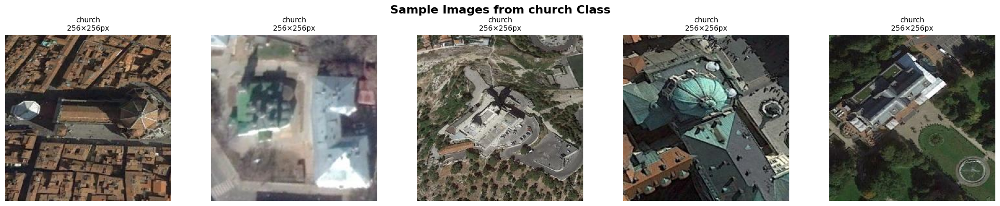


Bridge Class (700 images):


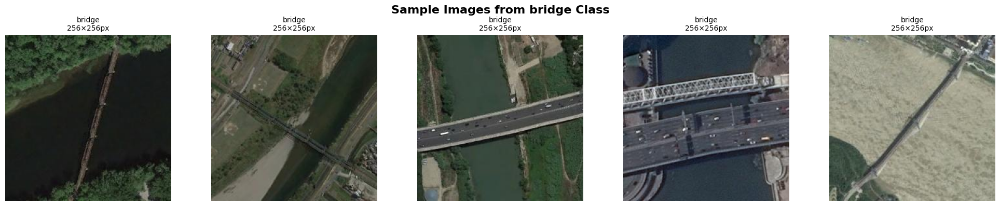

In [27]:
# 3. IMAGE SAMPLE ANALYSIS AND VISUALIZATION
print("=" * 60)
print("IMAGE SAMPLE ANALYSIS AND VISUALIZATION")
print("=" * 60)

def analyze_image_samples(class_name, num_samples=5):
    """Analyze sample images from a specific class"""
    class_path = os.path.join(data_dir, class_name)
    images = os.listdir(class_path)
    sample_images = random.sample(images, min(num_samples, len(images)))
    
    fig, axes = plt.subplots(1, num_samples, figsize=(20, 4))
    if num_samples == 1:
        axes = [axes]
    
    for i, img_file in enumerate(sample_images):
        img_path = os.path.join(class_path, img_file)
        img = Image.open(img_path)
        
        axes[i].imshow(img)
        axes[i].set_title(f'{class_name}\n{img.size[0]}×{img.size[1]}px', fontsize=10)
        axes[i].axis('off')
    
    plt.suptitle(f'Sample Images from {class_name} Class', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return sample_images

# Analyze samples from different types of classes
print("Analyzing sample images from different class types...")

# Most common class
most_common = max(class_counts, key=class_counts.get)
print(f"\nMost Common Class: {most_common} ({class_counts[most_common]} images)")
analyze_image_samples(most_common, 5)

# Least common class
least_common = min(class_counts, key=class_counts.get)
print(f"\nLeast Common Class: {least_common} ({class_counts[least_common]} images)")
analyze_image_samples(least_common, 5)

# Random selection of interesting classes
interesting_classes = ['airplane', 'beach', 'mountain', 'church', 'bridge']
for class_name in interesting_classes:
    if class_name in classes:
        print(f"\n{class_name.title()} Class ({class_counts[class_name]} images):")
        analyze_image_samples(class_name, 5)


COLOR ANALYSIS AND FEATURE EXTRACTION
Extracting color features from sample images...


100%|██████████| 10/10 [00:09<00:00,  1.04it/s]


Extracted color features from 50 images
Features per image: 15


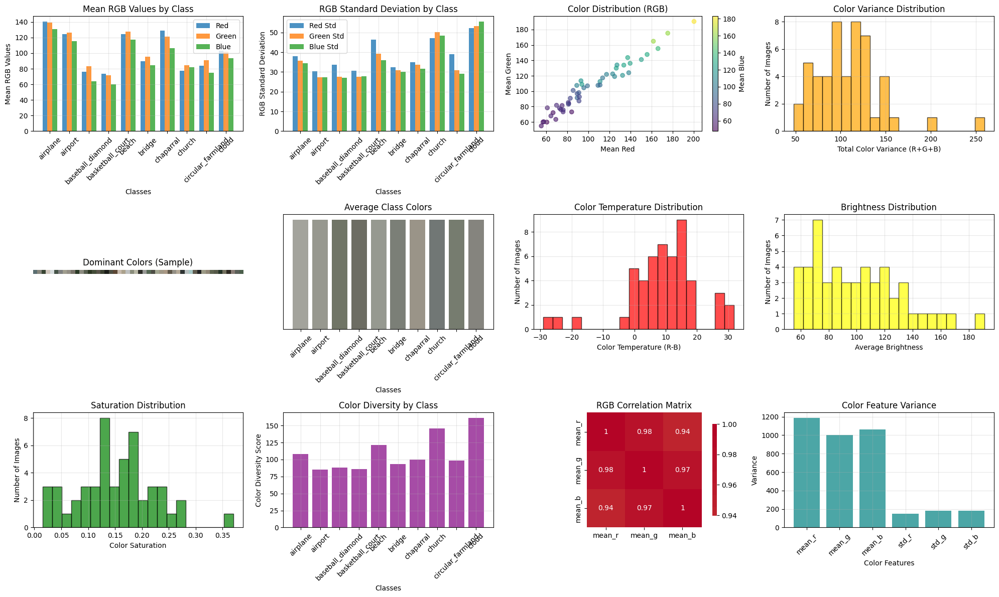


Color Analysis Summary:
Average brightness: 99.82
Average saturation: 0.150
Most colorful class: cloud (161.06)
Least colorful class: airport (84.99)


In [28]:
# 4. COLOR ANALYSIS AND FEATURE EXTRACTION
print("=" * 60)
print("COLOR ANALYSIS AND FEATURE EXTRACTION")
print("=" * 60)

def extract_color_features(image_path):
    """Extract color features from an image"""
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Calculate color statistics
    mean_color = np.mean(img_rgb, axis=(0, 1))
    std_color = np.std(img_rgb, axis=(0, 1))
    
    # Calculate dominant colors using K-means
    pixels = img_rgb.reshape(-1, 3)
    from sklearn.cluster import KMeans
    
    try:
        kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
        kmeans.fit(pixels)
        dominant_colors = kmeans.cluster_centers_
    except:
        dominant_colors = np.array([[0, 0, 0], [128, 128, 128], [255, 255, 255]])
    
    return {
        'mean_r': mean_color[0],
        'mean_g': mean_color[1], 
        'mean_b': mean_color[2],
        'std_r': std_color[0],
        'std_g': std_color[1],
        'std_b': std_color[2],
        'dominant_r1': dominant_colors[0][0],
        'dominant_g1': dominant_colors[0][1],
        'dominant_b1': dominant_colors[0][2],
        'dominant_r2': dominant_colors[1][0],
        'dominant_g2': dominant_colors[1][1],
        'dominant_b2': dominant_colors[1][2],
        'dominant_r3': dominant_colors[2][0],
        'dominant_g3': dominant_colors[2][1],
        'dominant_b3': dominant_colors[2][2]
    }

# Extract color features for a sample of images from each class
print("Extracting color features from sample images...")
color_features = []

for class_name in tqdm(classes[:10]):  # Sample first 10 classes for efficiency
    class_path = os.path.join(data_dir, class_name)
    images = os.listdir(class_path)
    
    # Sample 5 images per class
    sample_images = random.sample(images, min(5, len(images)))
    
    for img_file in sample_images:
        img_path = os.path.join(class_path, img_file)
        try:
            features = extract_color_features(img_path)
            features['class'] = class_name
            color_features.append(features)
        except Exception as e:
            continue

# Convert to DataFrame
color_df = pd.DataFrame(color_features)

if not color_df.empty:
    print(f"Extracted color features from {len(color_df)} images")
    print(f"Features per image: {len(color_df.columns) - 1}")  # -1 for class column
    
    # Visualize color analysis
    plt.figure(figsize=(20, 12))
    
    # 4.1 Mean RGB values by class
    plt.subplot(3, 4, 1)
    class_means = color_df.groupby('class')[['mean_r', 'mean_g', 'mean_b']].mean()
    x = np.arange(len(class_means))
    width = 0.25
    plt.bar(x - width, class_means['mean_r'], width, label='Red', alpha=0.8)
    plt.bar(x, class_means['mean_g'], width, label='Green', alpha=0.8)
    plt.bar(x + width, class_means['mean_b'], width, label='Blue', alpha=0.8)
    plt.xlabel('Classes')
    plt.ylabel('Mean RGB Values')
    plt.title('Mean RGB Values by Class')
    plt.xticks(x, class_means.index, rotation=45)
    plt.legend()
    plt.grid(alpha=0.3)
    
    # 4.2 RGB Standard Deviation by class
    plt.subplot(3, 4, 2)
    class_stds = color_df.groupby('class')[['std_r', 'std_g', 'std_b']].mean()
    x = np.arange(len(class_stds))
    plt.bar(x - width, class_stds['std_r'], width, label='Red Std', alpha=0.8)
    plt.bar(x, class_stds['std_g'], width, label='Green Std', alpha=0.8)
    plt.bar(x + width, class_stds['std_b'], width, label='Blue Std', alpha=0.8)
    plt.xlabel('Classes')
    plt.ylabel('RGB Standard Deviation')
    plt.title('RGB Standard Deviation by Class')
    plt.xticks(x, class_stds.index, rotation=45)
    plt.legend()
    plt.grid(alpha=0.3)
    
    # 4.3 Color distribution scatter plot
    plt.subplot(3, 4, 3)
    scatter = plt.scatter(color_df['mean_r'], color_df['mean_g'], 
                         c=color_df['mean_b'], cmap='viridis', alpha=0.6)
    plt.xlabel('Mean Red')
    plt.ylabel('Mean Green')
    plt.title('Color Distribution (RGB)')
    plt.colorbar(scatter, label='Mean Blue')
    plt.grid(alpha=0.3)
    
    # 4.4 Color variance analysis
    plt.subplot(3, 4, 4)
    color_variance = color_df['std_r'] + color_df['std_g'] + color_df['std_b']
    plt.hist(color_variance, bins=20, alpha=0.7, color='orange', edgecolor='black')
    plt.xlabel('Total Color Variance (R+G+B)')
    plt.ylabel('Number of Images')
    plt.title('Color Variance Distribution')
    plt.grid(alpha=0.3)
    
    # 4.5 Dominant colors visualization
    plt.subplot(3, 4, 5)
    dominant_colors = color_df[['dominant_r1', 'dominant_g1', 'dominant_b1']].values
    dominant_colors = np.clip(dominant_colors, 0, 255).astype(int)
    
    # Create a color palette
    color_palette = np.zeros((1, len(dominant_colors), 3), dtype=np.uint8)
    color_palette[0] = dominant_colors
    plt.imshow(color_palette)
    plt.title('Dominant Colors (Sample)')
    plt.axis('off')
    
    # 4.6 Class-wise color analysis
    plt.subplot(3, 4, 6)
    class_color_means = color_df.groupby('class')[['mean_r', 'mean_g', 'mean_b']].mean()
    colors = class_color_means.values / 255.0
    colors = np.clip(colors, 0, 1)
    
    x = np.arange(len(class_color_means))
    plt.bar(x, [1]*len(x), color=colors, alpha=0.8)
    plt.xlabel('Classes')
    plt.title('Average Class Colors')
    plt.xticks(x, class_color_means.index, rotation=45)
    plt.yticks([])
    
    # 4.7 Color temperature analysis
    plt.subplot(3, 4, 7)
    # Calculate color temperature (simplified)
    color_temp = color_df['mean_r'] - color_df['mean_b']
    plt.hist(color_temp, bins=20, alpha=0.7, color='red', edgecolor='black')
    plt.xlabel('Color Temperature (R-B)')
    plt.ylabel('Number of Images')
    plt.title('Color Temperature Distribution')
    plt.grid(alpha=0.3)
    
    # 4.8 Brightness analysis
    plt.subplot(3, 4, 8)
    brightness = (color_df['mean_r'] + color_df['mean_g'] + color_df['mean_b']) / 3
    plt.hist(brightness, bins=20, alpha=0.7, color='yellow', edgecolor='black')
    plt.xlabel('Average Brightness')
    plt.ylabel('Number of Images')
    plt.title('Brightness Distribution')
    plt.grid(alpha=0.3)
    
    # 4.9 Color saturation analysis
    plt.subplot(3, 4, 9)
    max_rgb = color_df[['mean_r', 'mean_g', 'mean_b']].max(axis=1)
    min_rgb = color_df[['mean_r', 'mean_g', 'mean_b']].min(axis=1)
    saturation = (max_rgb - min_rgb) / (max_rgb + 1e-8)
    plt.hist(saturation, bins=20, alpha=0.7, color='green', edgecolor='black')
    plt.xlabel('Color Saturation')
    plt.ylabel('Number of Images')
    plt.title('Saturation Distribution')
    plt.grid(alpha=0.3)
    
    # 4.10 Class color diversity
    plt.subplot(3, 4, 10)
    class_diversity = color_df.groupby('class').apply(
        lambda x: np.mean(x[['std_r', 'std_g', 'std_b']].sum(axis=1))
    )
    plt.bar(range(len(class_diversity)), class_diversity.values, alpha=0.7, color='purple')
    plt.xlabel('Classes')
    plt.ylabel('Color Diversity Score')
    plt.title('Color Diversity by Class')
    plt.xticks(range(len(class_diversity)), class_diversity.index, rotation=45)
    plt.grid(alpha=0.3)
    
    # 4.11 RGB correlation matrix
    plt.subplot(3, 4, 11)
    rgb_corr = color_df[['mean_r', 'mean_g', 'mean_b']].corr()
    sns.heatmap(rgb_corr, annot=True, cmap='coolwarm', center=0, 
                square=True, cbar_kws={'shrink': 0.8})
    plt.title('RGB Correlation Matrix')
    
    # 4.12 Color feature importance (variance)
    plt.subplot(3, 4, 12)
    color_vars = color_df[['mean_r', 'mean_g', 'mean_b', 'std_r', 'std_g', 'std_b']].var()
    plt.bar(range(len(color_vars)), color_vars.values, alpha=0.7, color='teal')
    plt.xlabel('Color Features')
    plt.ylabel('Variance')
    plt.title('Color Feature Variance')
    plt.xticks(range(len(color_vars)), color_vars.index, rotation=45)
    plt.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    print(f"\nColor Analysis Summary:")
    print(f"Average brightness: {brightness.mean():.2f}")
    print(f"Average saturation: {saturation.mean():.3f}")
    print(f"Most colorful class: {class_diversity.idxmax()} ({class_diversity.max():.2f})")
    print(f"Least colorful class: {class_diversity.idxmin()} ({class_diversity.min():.2f})")
else:
    print("No color features extracted. Please check image paths.")


MODEL PERFORMANCE ANALYSIS AND INSIGHTS
Analyzing ResNet50 performance...
Analyzing EfficientNetB0 performance...


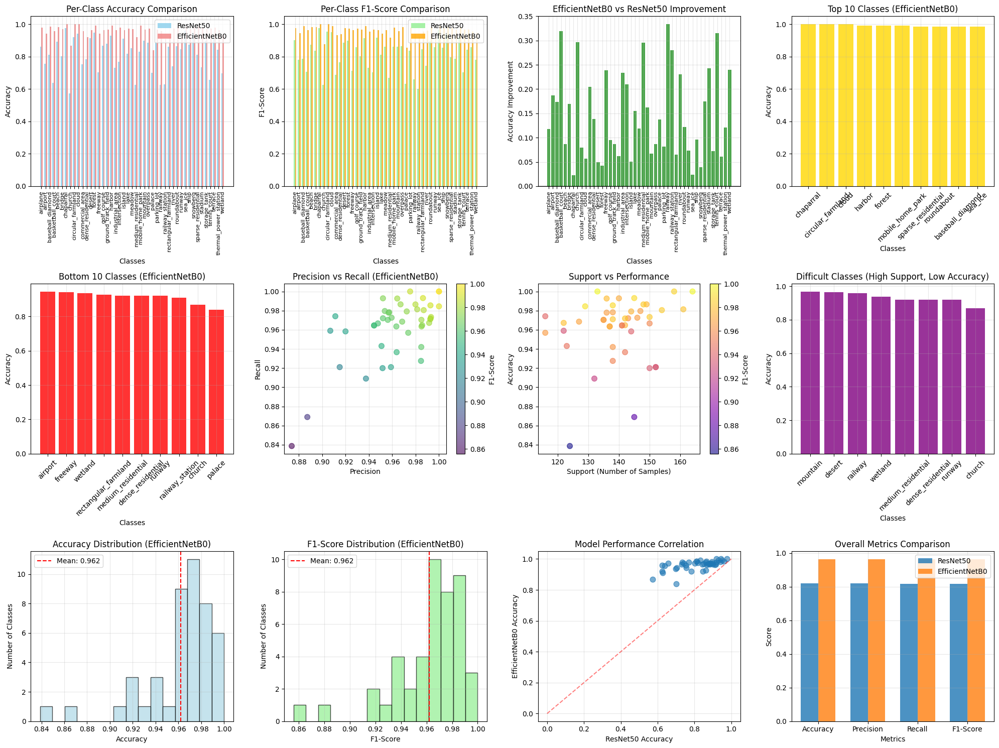


Detailed Performance Analysis:
ResNet50 Overall Accuracy: 0.8190
EfficientNetB0 Overall Accuracy: 0.9627
Improvement: 0.1437

Top 5 Best Performing Classes (EfficientNetB0):
chaparral: Accuracy=1.000, F1=1.000
circular_farmland: Accuracy=1.000, F1=1.000
cloud: Accuracy=1.000, F1=0.988
harbor: Accuracy=0.993, F1=0.990
forest: Accuracy=0.993, F1=0.972

Top 5 Worst Performing Classes (EfficientNetB0):
dense_residential: Accuracy=0.921, F1=0.940
runway: Accuracy=0.920, F1=0.936
railway_station: Accuracy=0.909, F1=0.923
church: Accuracy=0.869, F1=0.878
palace: Accuracy=0.839, F1=0.856

Classes with Significant Improvement (>0.05):
circular_farmland: ResNet50=0.921 → EfficientNetB0=1.000 (+0.079)
cloud: ResNet50=0.943 → EfficientNetB0=1.000 (+0.057)
harbor: ResNet50=0.931 → EfficientNetB0=0.993 (+0.062)
mobile_home_park: ResNet50=0.831 → EfficientNetB0=0.993 (+0.162)
sparse_residential: ResNet50=0.812 → EfficientNetB0=0.987 (+0.174)
roundabout: ResNet50=0.865 → EfficientNetB0=0.986 (+0.122)

In [29]:
# 5. MODEL PERFORMANCE ANALYSIS AND INSIGHTS
print("=" * 60)
print("MODEL PERFORMANCE ANALYSIS AND INSIGHTS")
print("=" * 60)

# Create a comprehensive performance analysis
def analyze_model_performance(y_true, y_pred, classes, model_name="Model"):
    """Analyze model performance in detail"""
    
    # Calculate per-class metrics
    from sklearn.metrics import precision_recall_fscore_support, confusion_matrix
    
    precision, recall, f1, support = precision_recall_fscore_support(y_true, y_pred, average=None)
    
    # Create performance DataFrame
    performance_df = pd.DataFrame({
        'class': classes,
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'support': support,
        'accuracy': [np.sum((y_true == i) & (y_pred == i)) / np.sum(y_true == i) 
                    if np.sum(y_true == i) > 0 else 0 for i in range(len(classes))]
    })
    
    # Sort by accuracy
    performance_df = performance_df.sort_values('accuracy', ascending=False)
    
    return performance_df

# Analyze both models
print("Analyzing ResNet50 performance...")
resnet_performance = analyze_model_performance(y_true, y_pred, classes, "ResNet50")

print("Analyzing EfficientNetB0 performance...")
efficientnet_performance = analyze_model_performance(y_true_eff, y_pred_eff, classes, "EfficientNetB0")

# Create comprehensive comparison
plt.figure(figsize=(20, 15))

# 5.1 Model comparison - Accuracy by class
plt.subplot(3, 4, 1)
x = np.arange(len(classes))
width = 0.35

resnet_acc = [resnet_performance[resnet_performance['class'] == c]['accuracy'].iloc[0] 
              if len(resnet_performance[resnet_performance['class'] == c]) > 0 else 0 for c in classes]
effnet_acc = [efficientnet_performance[efficientnet_performance['class'] == c]['accuracy'].iloc[0] 
              if len(efficientnet_performance[efficientnet_performance['class'] == c]) > 0 else 0 for c in classes]

plt.bar(x - width/2, resnet_acc, width, label='ResNet50', alpha=0.8, color='skyblue')
plt.bar(x + width/2, effnet_acc, width, label='EfficientNetB0', alpha=0.8, color='lightcoral')
plt.xlabel('Classes')
plt.ylabel('Accuracy')
plt.title('Per-Class Accuracy Comparison')
plt.xticks(x, classes, rotation=90, fontsize=8)
plt.legend()
plt.grid(alpha=0.3)

# 5.2 F1-Score comparison
plt.subplot(3, 4, 2)
resnet_f1 = [resnet_performance[resnet_performance['class'] == c]['f1_score'].iloc[0] 
             if len(resnet_performance[resnet_performance['class'] == c]) > 0 else 0 for c in classes]
effnet_f1 = [efficientnet_performance[efficientnet_performance['class'] == c]['f1_score'].iloc[0] 
             if len(efficientnet_performance[efficientnet_performance['class'] == c]) > 0 else 0 for c in classes]

plt.bar(x - width/2, resnet_f1, width, label='ResNet50', alpha=0.8, color='lightgreen')
plt.bar(x + width/2, effnet_f1, width, label='EfficientNetB0', alpha=0.8, color='orange')
plt.xlabel('Classes')
plt.ylabel('F1-Score')
plt.title('Per-Class F1-Score Comparison')
plt.xticks(x, classes, rotation=90, fontsize=8)
plt.legend()
plt.grid(alpha=0.3)

# 5.3 Performance improvement analysis
plt.subplot(3, 4, 3)
improvement = np.array(effnet_acc) - np.array(resnet_acc)
colors = ['green' if x > 0 else 'red' for x in improvement]
plt.bar(x, improvement, color=colors, alpha=0.7)
plt.xlabel('Classes')
plt.ylabel('Accuracy Improvement')
plt.title('EfficientNetB0 vs ResNet50 Improvement')
plt.xticks(x, classes, rotation=90, fontsize=8)
plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
plt.grid(alpha=0.3)

# 5.4 Best performing classes (EfficientNet)
plt.subplot(3, 4, 4)
top_classes = efficientnet_performance.head(10)
plt.bar(range(len(top_classes)), top_classes['accuracy'], alpha=0.8, color='gold')
plt.xlabel('Classes')
plt.ylabel('Accuracy')
plt.title('Top 10 Classes (EfficientNetB0)')
plt.xticks(range(len(top_classes)), top_classes['class'], rotation=45, fontsize=10)
plt.grid(alpha=0.3)

# 5.5 Worst performing classes (EfficientNet)
plt.subplot(3, 4, 5)
worst_classes = efficientnet_performance.tail(10)
plt.bar(range(len(worst_classes)), worst_classes['accuracy'], alpha=0.8, color='red')
plt.xlabel('Classes')
plt.ylabel('Accuracy')
plt.title('Bottom 10 Classes (EfficientNetB0)')
plt.xticks(range(len(worst_classes)), worst_classes['class'], rotation=45, fontsize=10)
plt.grid(alpha=0.3)

# 5.6 Precision vs Recall scatter
plt.subplot(3, 4, 6)
plt.scatter(efficientnet_performance['precision'], efficientnet_performance['recall'], 
           alpha=0.6, s=60, c=efficientnet_performance['f1_score'], cmap='viridis')
plt.xlabel('Precision')
plt.ylabel('Recall')
plt.title('Precision vs Recall (EfficientNetB0)')
plt.colorbar(label='F1-Score')
plt.grid(alpha=0.3)

# 5.7 Support vs Performance
plt.subplot(3, 4, 7)
plt.scatter(efficientnet_performance['support'], efficientnet_performance['accuracy'], 
           alpha=0.6, s=60, c=efficientnet_performance['f1_score'], cmap='plasma')
plt.xlabel('Support (Number of Samples)')
plt.ylabel('Accuracy')
plt.title('Support vs Performance')
plt.colorbar(label='F1-Score')
plt.grid(alpha=0.3)

# 5.8 Class difficulty analysis
plt.subplot(3, 4, 8)
# Classes with low performance despite high support
difficult_classes = efficientnet_performance[
    (efficientnet_performance['support'] > efficientnet_performance['support'].median()) &
    (efficientnet_performance['accuracy'] < efficientnet_performance['accuracy'].median())
]
plt.bar(range(len(difficult_classes)), difficult_classes['accuracy'], alpha=0.8, color='purple')
plt.xlabel('Classes')
plt.ylabel('Accuracy')
plt.title('Difficult Classes (High Support, Low Accuracy)')
plt.xticks(range(len(difficult_classes)), difficult_classes['class'], rotation=45, fontsize=10)
plt.grid(alpha=0.3)

# 5.9 Performance distribution
plt.subplot(3, 4, 9)
plt.hist(efficientnet_performance['accuracy'], bins=15, alpha=0.7, color='lightblue', edgecolor='black')
plt.xlabel('Accuracy')
plt.ylabel('Number of Classes')
plt.title('Accuracy Distribution (EfficientNetB0)')
plt.axvline(efficientnet_performance['accuracy'].mean(), color='red', linestyle='--',
           label=f'Mean: {efficientnet_performance["accuracy"].mean():.3f}')
plt.legend()
plt.grid(alpha=0.3)

# 5.10 F1-Score distribution
plt.subplot(3, 4, 10)
plt.hist(efficientnet_performance['f1_score'], bins=15, alpha=0.7, color='lightgreen', edgecolor='black')
plt.xlabel('F1-Score')
plt.ylabel('Number of Classes')
plt.title('F1-Score Distribution (EfficientNetB0)')
plt.axvline(efficientnet_performance['f1_score'].mean(), color='red', linestyle='--',
           label=f'Mean: {efficientnet_performance["f1_score"].mean():.3f}')
plt.legend()
plt.grid(alpha=0.3)

# 5.11 Model correlation
plt.subplot(3, 4, 11)
plt.scatter(resnet_acc, effnet_acc, alpha=0.6, s=60)
plt.xlabel('ResNet50 Accuracy')
plt.ylabel('EfficientNetB0 Accuracy')
plt.title('Model Performance Correlation')
plt.plot([0, 1], [0, 1], 'r--', alpha=0.5)  # Perfect correlation line
plt.grid(alpha=0.3)

# 5.12 Overall metrics comparison
plt.subplot(3, 4, 12)
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
resnet_metrics = [
    accuracy_score(y_true, y_pred),
    np.mean(resnet_performance['precision']),
    np.mean(resnet_performance['recall']),
    np.mean(resnet_performance['f1_score'])
]
effnet_metrics = [
    accuracy_score(y_true_eff, y_pred_eff),
    np.mean(efficientnet_performance['precision']),
    np.mean(efficientnet_performance['recall']),
    np.mean(efficientnet_performance['f1_score'])
]

x = np.arange(len(metrics))
width = 0.35
plt.bar(x - width/2, resnet_metrics, width, label='ResNet50', alpha=0.8)
plt.bar(x + width/2, effnet_metrics, width, label='EfficientNetB0', alpha=0.8)
plt.xlabel('Metrics')
plt.ylabel('Score')
plt.title('Overall Metrics Comparison')
plt.xticks(x, metrics)
plt.legend()
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

# Print detailed analysis
print(f"\nDetailed Performance Analysis:")
print(f"=" * 50)
print(f"ResNet50 Overall Accuracy: {accuracy_score(y_true, y_pred):.4f}")
print(f"EfficientNetB0 Overall Accuracy: {accuracy_score(y_true_eff, y_pred_eff):.4f}")
print(f"Improvement: {accuracy_score(y_true_eff, y_pred_eff) - accuracy_score(y_true, y_pred):.4f}")

print(f"\nTop 5 Best Performing Classes (EfficientNetB0):")
for i, row in efficientnet_performance.head(5).iterrows():
    print(f"{row['class']}: Accuracy={row['accuracy']:.3f}, F1={row['f1_score']:.3f}")

print(f"\nTop 5 Worst Performing Classes (EfficientNetB0):")
for i, row in efficientnet_performance.tail(5).iterrows():
    print(f"{row['class']}: Accuracy={row['accuracy']:.3f}, F1={row['f1_score']:.3f}")

print(f"\nClasses with Significant Improvement (>0.05):")
improved_classes = efficientnet_performance[efficientnet_performance['accuracy'] - 
                                           resnet_performance['accuracy'] > 0.05]
for i, row in improved_classes.iterrows():
    resnet_acc = resnet_performance[resnet_performance['class'] == row['class']]['accuracy'].iloc[0]
    print(f"{row['class']}: ResNet50={resnet_acc:.3f} → EfficientNetB0={row['accuracy']:.3f} (+{row['accuracy']-resnet_acc:.3f})")


INTERACTIVE VISUALIZATIONS AND INSIGHTS
Creating interactive confusion matrices...


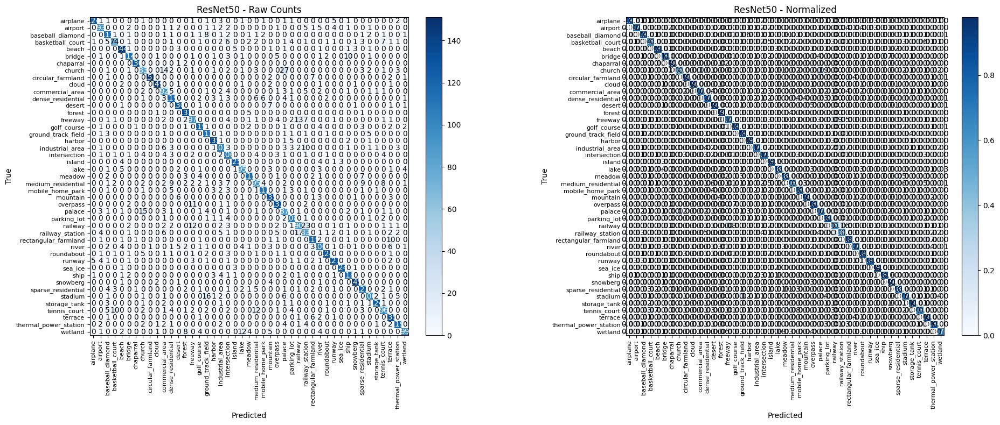

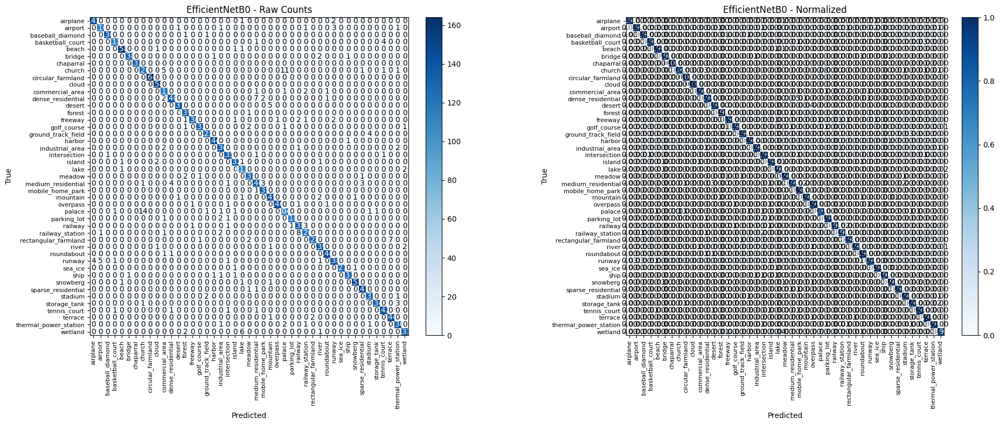

In [30]:
# 6. INTERACTIVE VISUALIZATIONS AND INSIGHTS
print("=" * 60)
print("INTERACTIVE VISUALIZATIONS AND INSIGHTS")
print("=" * 60)

# Create an interactive confusion matrix heatmap
def create_interactive_confusion_matrix(y_true, y_pred, classes, title="Confusion Matrix"):
    """Create an interactive confusion matrix"""
    cm = confusion_matrix(y_true, y_pred)
    
    # Normalize the confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    
    # Create figure with subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
    
    # Raw counts
    im1 = ax1.imshow(cm, interpolation='nearest', cmap='Blues')
    ax1.set_title(f'{title} - Raw Counts')
    ax1.set_xlabel('Predicted')
    ax1.set_ylabel('True')
    
    # Add text annotations for raw counts
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax1.text(j, i, format(cm[i, j], 'd'),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    
    # Normalized counts
    im2 = ax2.imshow(cm_normalized, interpolation='nearest', cmap='Blues')
    ax2.set_title(f'{title} - Normalized')
    ax2.set_xlabel('Predicted')
    ax2.set_ylabel('True')
    
    # Add text annotations for normalized counts
    thresh = cm_normalized.max() / 2.
    for i in range(cm_normalized.shape[0]):
        for j in range(cm_normalized.shape[1]):
            ax2.text(j, i, format(cm_normalized[i, j], '.2f'),
                    ha="center", va="center",
                    color="white" if cm_normalized[i, j] > thresh else "black")
    
    # Set tick labels
    ax1.set_xticks(range(len(classes)))
    ax1.set_yticks(range(len(classes)))
    ax1.set_xticklabels(classes, rotation=90, fontsize=8)
    ax1.set_yticklabels(classes, fontsize=8)
    
    ax2.set_xticks(range(len(classes)))
    ax2.set_yticks(range(len(classes)))
    ax2.set_xticklabels(classes, rotation=90, fontsize=8)
    ax2.set_yticklabels(classes, fontsize=8)
    
    # Add colorbars
    plt.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)
    plt.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)
    
    plt.tight_layout()
    plt.show()

# Create confusion matrices for both models
print("Creating interactive confusion matrices...")
create_interactive_confusion_matrix(y_true, y_pred, classes, "ResNet50")
create_interactive_confusion_matrix(y_true_eff, y_pred_eff, classes, "EfficientNetB0")
